In [16]:
import os

import scanpy as sc
import numpy as np
import pandas as pd

import scSLAT
from scSLAT.model import load_anndatas, Cal_Spatial_Net, run_SLAT, scanpy_workflow, spatial_match
from scSLAT.viz import hist
from scSLAT.viz.multi_dataset import match_3D_multi, Sankey, match_3D_celltype, Sankey
from scSLAT.metrics import region_statistics

In [15]:
from importlib import reload
reload(scSLAT.viz)
reload(scSLAT.viz.multi_dataset)

<module 'scSLAT.viz.multi_dataset' from '/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py'>

In [3]:
sc.set_figure_params(dpi=150, dpi_save=150)

In [4]:
adata1 = sc.read_h5ad('./adata1.h5ad')
adata2 = sc.read_h5ad('./adata2.h5ad')

In [5]:
Cal_Spatial_Net(adata1, k_cutoff=50, model='KNN')
Cal_Spatial_Net(adata2, k_cutoff=50, model='KNN')
edges, features = load_anndatas([adata1, adata2], feature='DPCA', check_order=False)

Calculating spatial neighbor graph ...
The graph contains 537308 edges, 10000 cells.
53.7308 neighbors per cell on average.
Calculating spatial neighbor graph ...
The graph contains 539939 edges, 10001 cells.
53.98850114988501 neighbors per cell on average.
Use DPCA feature to format graph


/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  view_to_actual(adata)
/rd2/user/xiacr/SLAT/conda/lib/python3.

Warning! Dual PCA is using GPU, which may lead to OUT OF GPU MEMORY in big dataset!


# check DPCA alignment

In [6]:
best_harm, index_harm, distance_harm = spatial_match(features, reorder=False)

In [7]:
adata1_harm_df = pd.DataFrame({'index':range(features[0].shape[0]),
                          'x': adata1.obsm['spatial'][:,0],
                          'y': adata1.obsm['spatial'][:,1],
                          'celltype':adata1.obs['annotation']})
adata2_harm_df = pd.DataFrame({'index':range(features[1].shape[0]),
                          'x': adata2.obsm['spatial'][:,0],
                          'y': adata2.obsm['spatial'][:,1],
                          'celltype':adata2.obs['annotation']})
matching_harm = np.array([range(index_harm.shape[0]), best_harm])
best_match_harm = distance_harm[:,0]
region_statistics(best_match_harm,start=0.5,number_of_interval=10)

0.500~0.550         6          0.060%
0.550~0.600        33          0.330%
0.600~0.650       133          1.330%
0.650~0.700       381          3.810%
0.700~0.750       975          9.749%
0.750~0.800      1546         15.458%
0.800~0.850      1940         19.398%
0.850~0.900      1729         17.288%
0.900~0.950      2066         20.658%
0.950~1.000      1191         11.909%


dataset1: 18 cell types; dataset2: 22 cell types; 
                    Total :29 celltypes; Overlap: 11 cell types 
                    Not overlap :[['Surface ectoderm', 'Head mesenchyme', 'Sclerotome', 'Spinal cord', 'Branchial arch', 'Dermomyotome', 'Inner ear', 'Mesentery', 'Epidermis', 'Muscle', 'Cartilage primordium', 'Mucosal epithelium', 'Pancreas', 'Ovary', 'Kidney', 'Choroid plexus', 'Sympathetic nerve', 'Mesothelium']]
Subsampled 10001 pairs from 10001


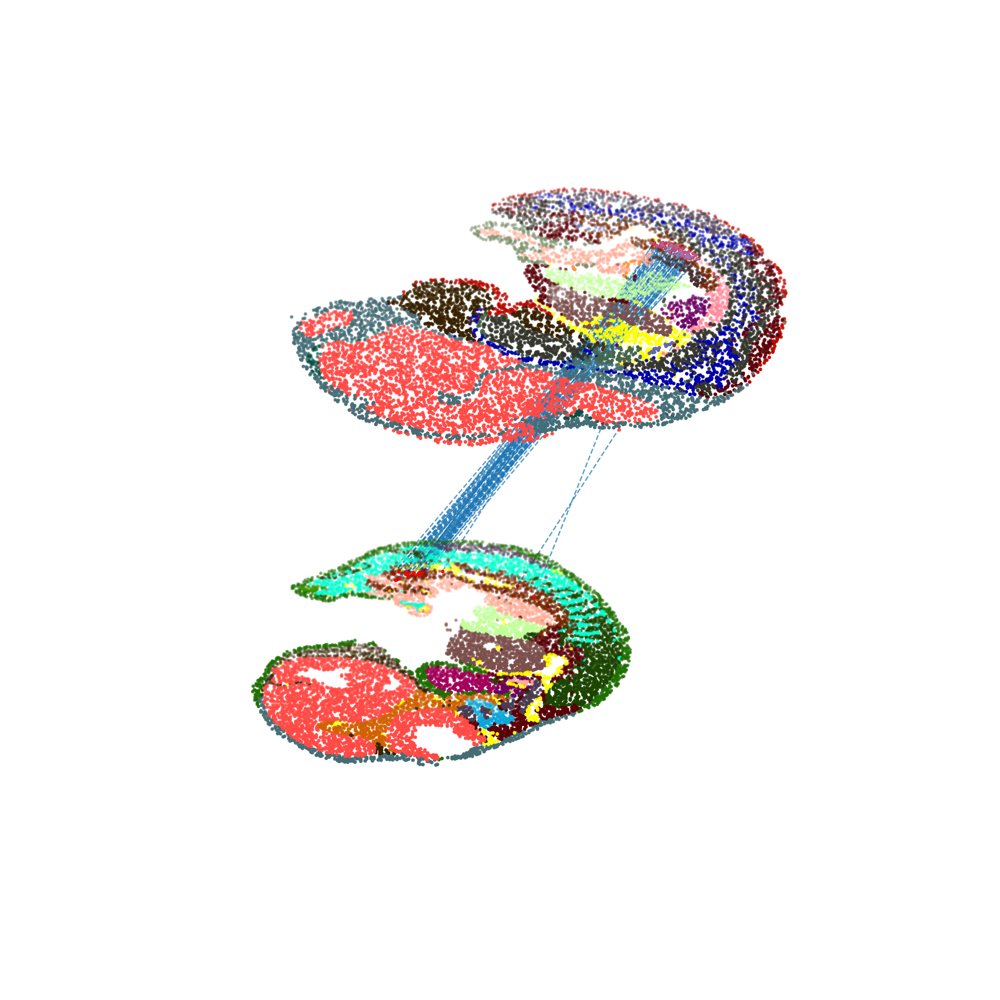

In [17]:
test = match_3D_celltype(adata1_harm_df, adata2_harm_df, matching_harm, meta='celltype', 
                         highlight_celltype=[['Urogenital ridge'], ['Kidney']],
                         subsample_size=-1, highlight_cell=['red'])
test.draw_3D(size=[10, 12], line_width=0.8, point_size=[1.2,1.2], hide_axis=True)

In [18]:
adata1.obsm['X_dpca'] = features[0].cpu().numpy()
adata2.obsm['X_dpca'] = features[1].cpu().numpy()

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
OMP: Info #277: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


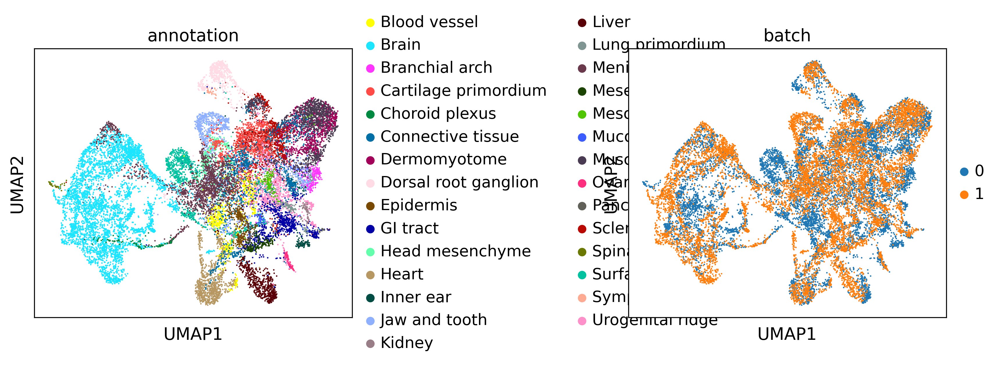

In [9]:
adata_all = adata1.concatenate(adata2)
sc.pp.neighbors(adata_all, metric="cosine", use_rep='X_dpca', n_pcs=50)
sc.tl.umap(adata_all)
sc.pl.umap(adata_all, color=["annotation", "batch"], wspace=0.7)

# run SLAT

In [19]:
embd0, embd1, time = run_SLAT(features, edges, LGCN_layer=5)

Choose GPU:0 as device
Running
---------- epochs: 1 ----------
---------- epochs: 2 ----------
---------- epochs: 3 ----------
---------- epochs: 4 ----------
---------- epochs: 5 ----------
---------- epochs: 6 ----------
Training model time: 2.73


In [20]:
best, index, distance = spatial_match([embd0, embd1], reorder=False, adatas=[adata1,adata2])

In [21]:
adata1_df = pd.DataFrame({'index':range(embd0.shape[0]),
                          'x': adata1.obsm['spatial'][:,0],
                          'y': adata1.obsm['spatial'][:,1],
                          'celltype':adata1.obs['annotation']})
adata2_df = pd.DataFrame({'index':range(embd1.shape[0]),
                          'x': adata2.obsm['spatial'][:,0],
                          'y': adata2.obsm['spatial'][:,1],
                          'celltype':adata2.obs['annotation']})
matching = np.array([range(index.shape[0]), best])
best_match = distance[:,0]
region_statistics(best_match,start=0.5,number_of_interval=10)

0.500~0.550         6          0.060%
0.550~0.600        38          0.380%
0.600~0.650       162          1.620%
0.650~0.700       500          5.000%
0.700~0.750      1202         12.019%
0.750~0.800      1811         18.108%
0.800~0.850      1871         18.708%
0.850~0.900      1737         17.368%
0.900~0.950      1998         19.978%
0.950~1.000       675          6.749%


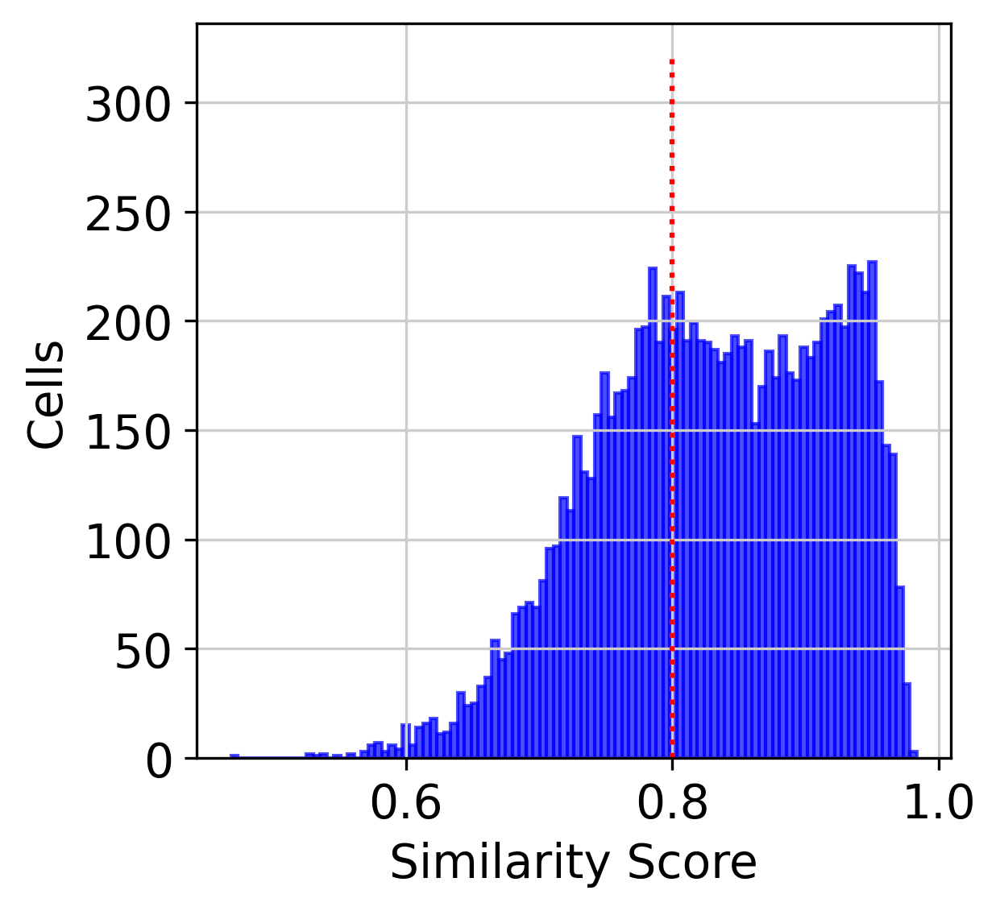

In [22]:
hist(best_match,cut=0.8,cut_height=320)

/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:204: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    Total :29 celltypes; Overlap: 11 cell types 
                    Not overlap :[['Sclerotome', 'Surface ectoderm', 'Branchial arch', 'Inner ear', 'Head mesenchyme', 'Spinal cord', 'Dermomyotome', 'Mesentery', 'Cartilage primordium', 'Muscle', 'Pancreas', 'Epidermis', 'Ovary', 'Sympathetic nerve', 'Choroid plexus', 'Kidney', 'Mucosal epithelium', 'Mesothelium']]
Subsample 300 cell pairs from 10001


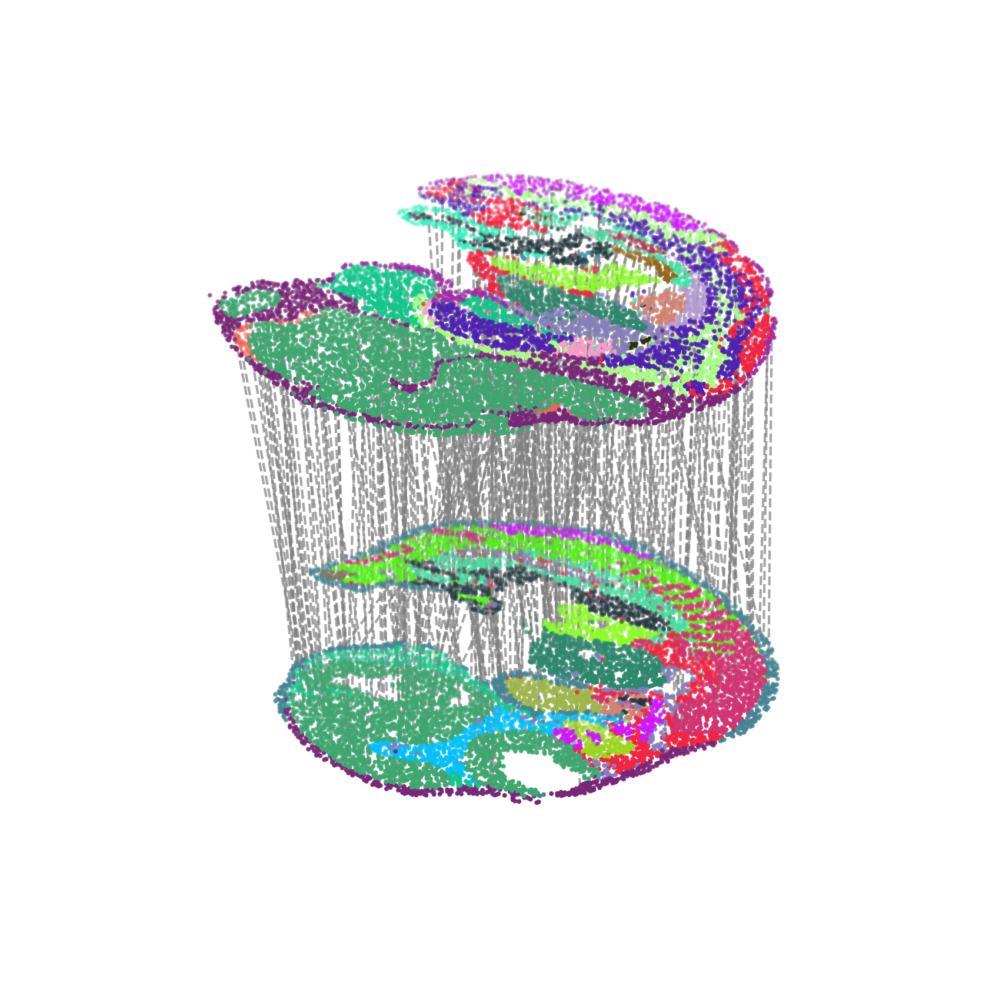

In [78]:
multi_align = match_3D_multi(adata1_df, adata2_df,matching,meta='celltype',
                             scale_coordinate=True,subsample_size=300,exchange_xy=False)

multi_align.draw_3D(size= [7, 8],line_width =1,point_size=[0.8,0.8], hide_axis=True,show_error=False)

In [79]:
adata2.obs['low_quality_index']= best_match 
adata2.obs['low_quality_index'] = adata2.obs['low_quality_index'].astype(float)

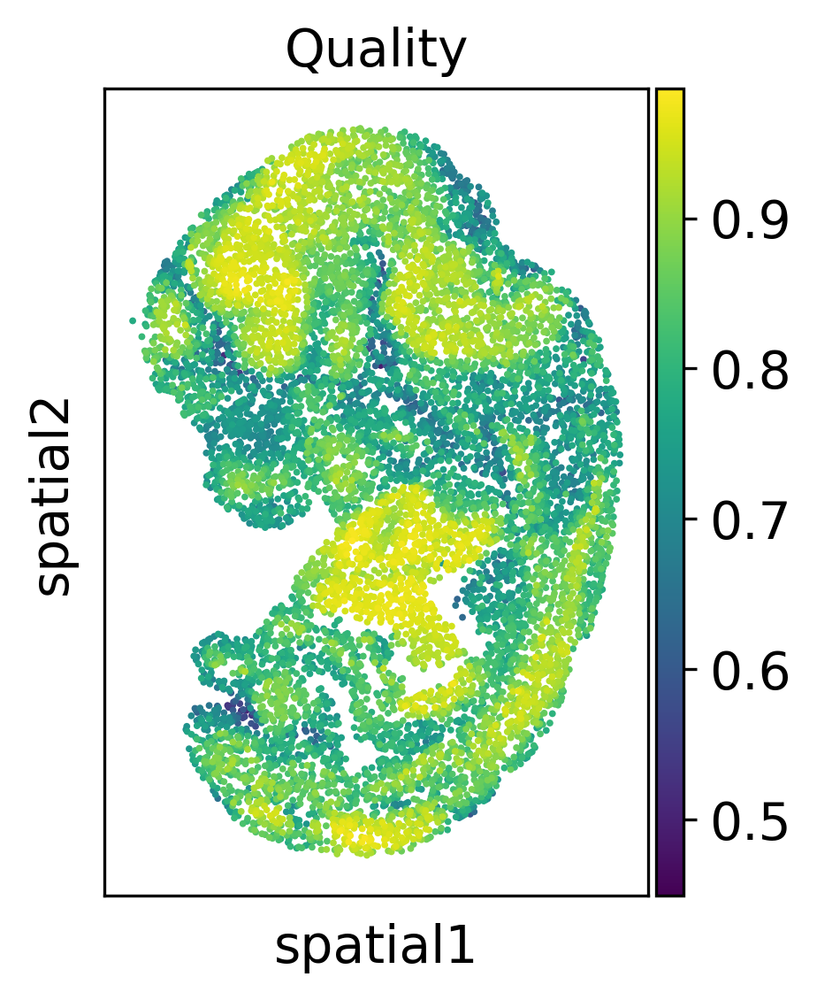

In [80]:
sc.pl.spatial(adata2, color='low_quality_index', spot_size=3, title='Quality')

In [23]:
# reverse matching
best_rev, index_rev, distance_rev = spatial_match([embd1, embd0], reorder=False, adatas=[adata2,adata1])

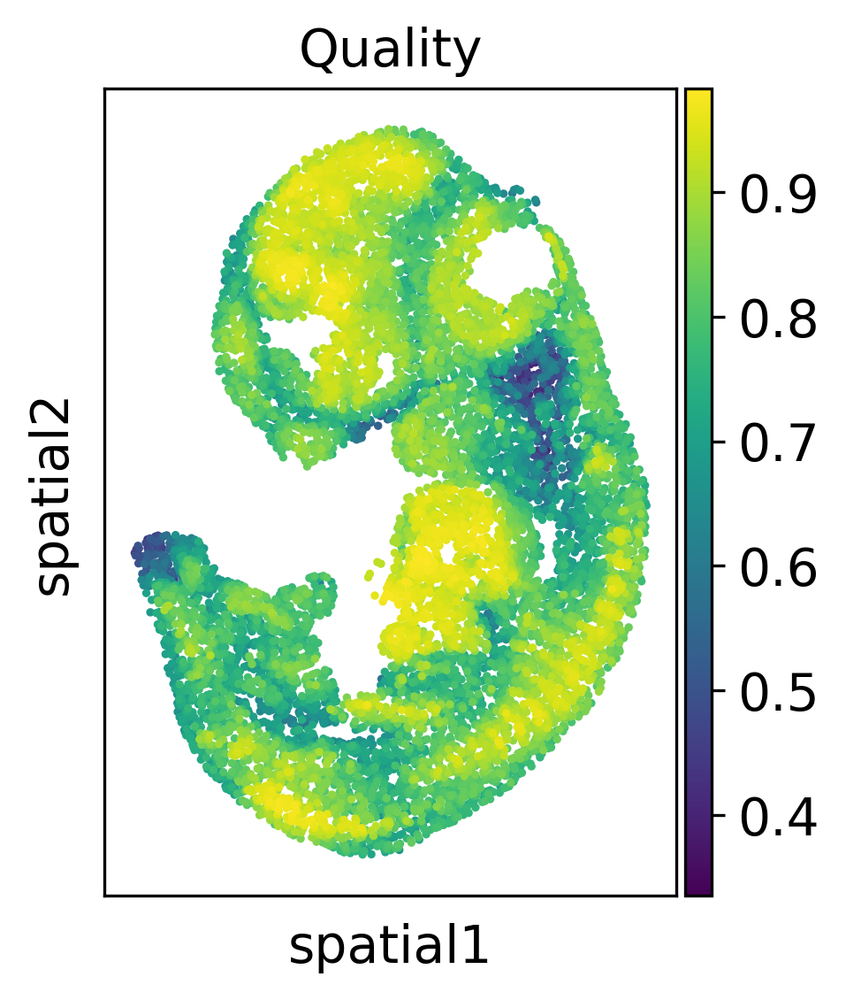

In [26]:
adata1.obs['low_quality_index_rev']= distance_rev[:,0] 
adata1.obs['low_quality_index_rev'] = adata1.obs['low_quality_index_rev'].astype(float)
sc.pl.spatial(adata1, color='low_quality_index_rev', spot_size=3, title='Quality')

In [81]:
adata2_df['target_celltype'] = adata1_df.iloc[matching[1,:],:]['celltype'].to_list()

In [82]:
matching_table = adata2_df.groupby(['celltype','target_celltype']).size().unstack(fill_value=0)

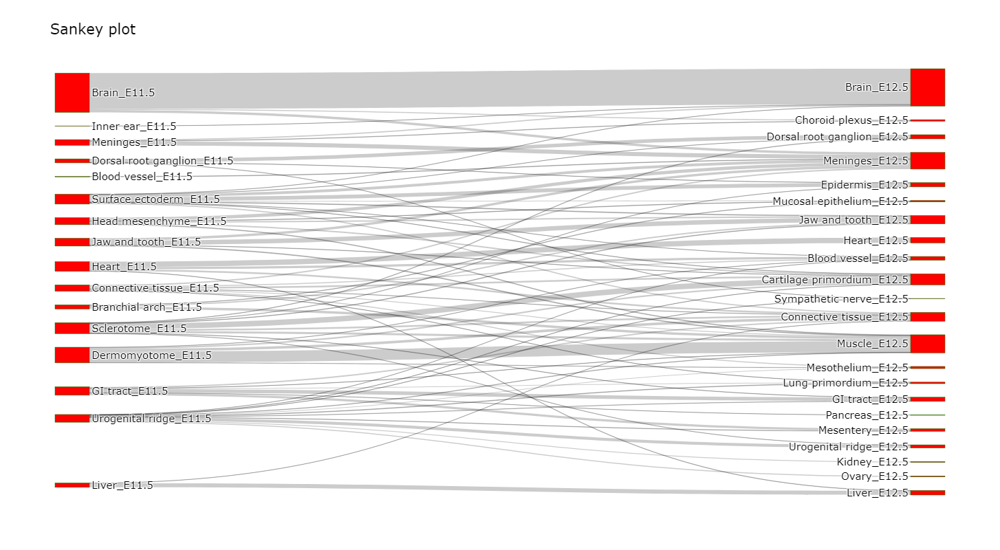

In [83]:
Sankey(matching_table, layout=[650,800], font_size=15)

In [21]:
np.savetxt('./SALT_alignment.csv', matching, delimiter=',')
np.savetxt('./SALT_emb0.csv', embd0.cpu().detach().numpy(), delimiter=',')
np.savetxt('./SALT_emb1.csv', embd1.cpu().detach().numpy(), delimiter=',')

# Kidney in development

In [16]:
kidney_prime = adata1[matching[1,adata2_df.loc[adata2_df.celltype=='Kidney','index'].values],:]
kidney = adata2[adata2.obs.annotation=='Kidney',:]
kidney_all = kidney_prime.concatenate(kidney)

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [110]:
kidney_all.X = kidney_all.layers['counts'].todense()

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


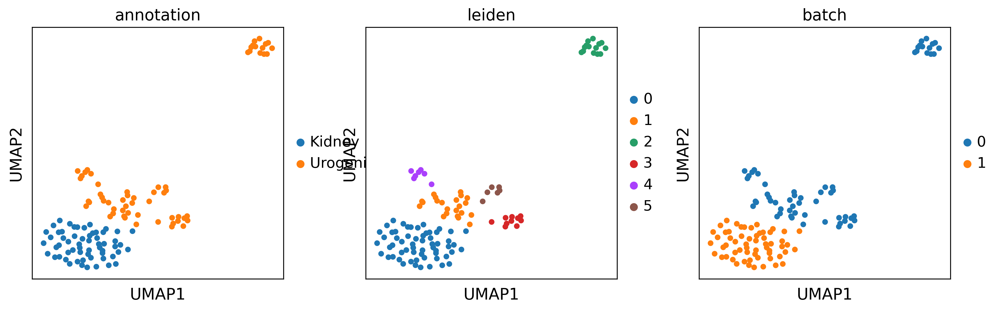

In [17]:
kidney_all = scanpy_workflow(kidney_all)
sc.pp.neighbors(kidney_all, metric="cosine")
sc.tl.umap(kidney_all)
sc.tl.leiden(kidney_all, resolution=1)
sc.pl.umap(kidney_all, color=['annotation','leiden','batch'],size=100)

In [109]:
kidney_all = kidney_all[kidney_all.obs.leiden.isin(['0','1','2','3']),]

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


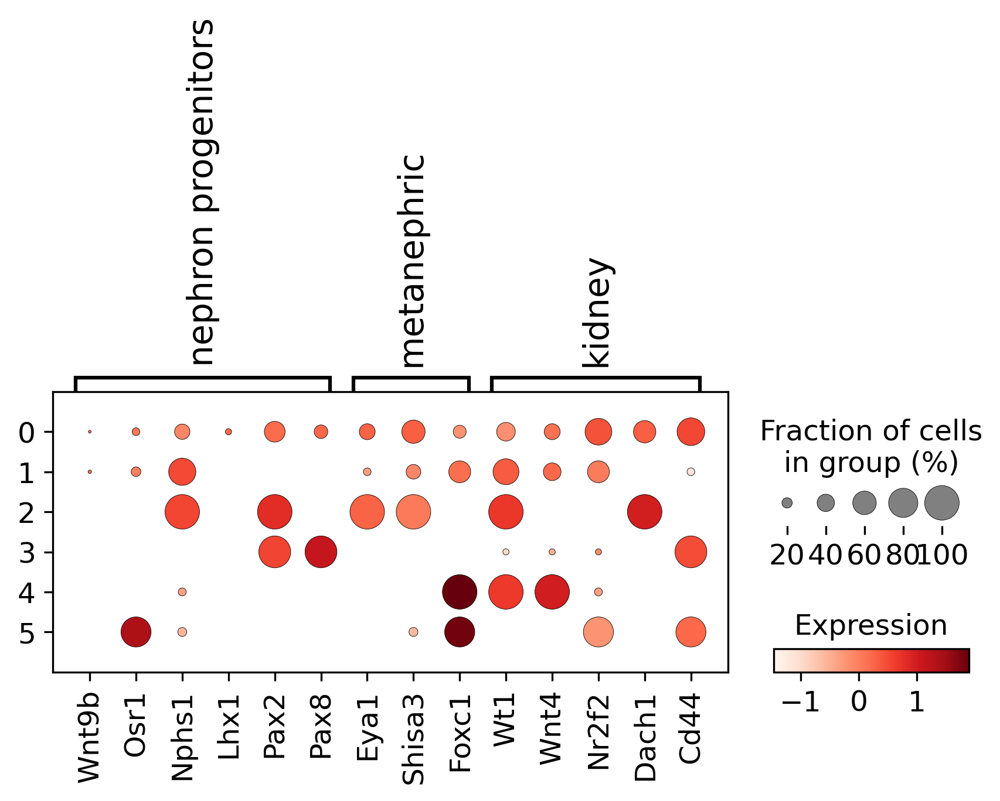

In [18]:
# Nphs1 https://www.nature.com/articles/s41467-021-22266-1
sc.pl.dotplot(kidney_all,{'nephron progenitors':['Wnt9b','Osr1','Nphs1','Lhx1','Pax2','Pax8'],
                         'metanephric':['Eya1','Shisa3','Foxc1'], 
                         'kidney':['Wt1','Wnt4','Nr2f2','Dach1','Cd44']} ,
              'leiden',dendrogram=False,colorbar_title='Expression')

In [41]:
kidney_all.obs['re_anno'] = 'Unknown'
kidney_all.obs.loc[kidney_all.obs.leiden.isin(['2']),'re_anno'] = 'Nephron progenitors (E11.5)'
kidney_all.obs.loc[kidney_all.obs.leiden.isin(['1','3','4','5']),'re_anno'] = 'Metanephron progenitors (E11.5)'
kidney_all.obs.loc[kidney_all.obs.leiden=='0','re_anno'] = 'Kidney (E12.5)'

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


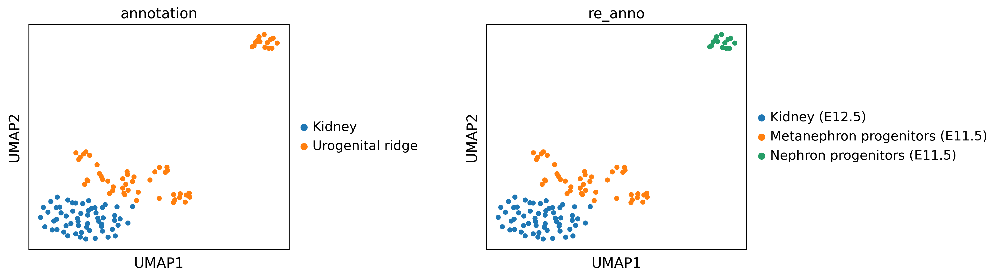

In [42]:
# kidney_all = kidney_all[kidney_all.obs.leiden!='3',:]
kidney_all.obs.leiden = list(kidney_all.obs.leiden)
sc.pl.umap(kidney_all, color=['annotation', 're_anno'],size=100, ncols=2,wspace=0.6)

categories: 0, 1, 2, etc.
var_group_labels: nephron progenitors, metanephic, kidney


/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored



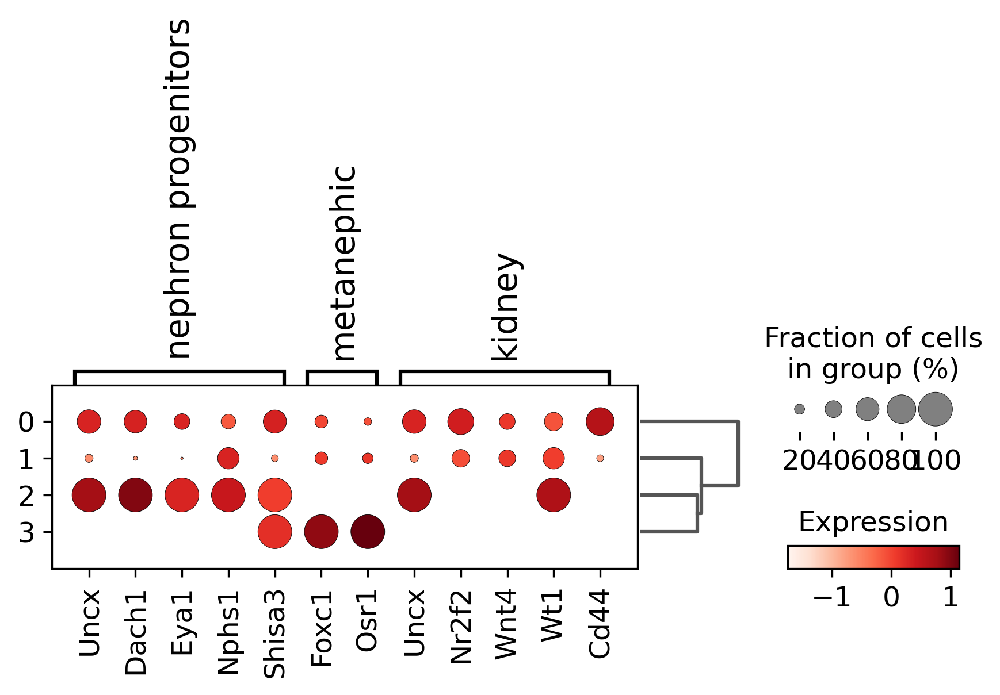

In [118]:
# https://www.nature.com/articles/s41467-021-22266-1
# https://genomemedicine.biomedcentral.com/articles/10.1186/s13073-019-0615-0/figures/1
sc.pl.dotplot(kidney_all, {'nephron progenitors':['Uncx','Dach1','Eya1','Nphs1','Shisa3'],
                           'metanephic':['Foxc1','Osr1'],
                         'kidney':['Uncx','Nr2f2','Wnt4','Wt1','Cd44']} ,
              'leiden',dendrogram=True,colorbar_title='Expression')

In [44]:
adata1.obs.drop('kidney_anno', axis=1, inplace=True)

In [45]:
kidney_1 = kidney_all.obs.loc[kidney_all.obs.batch=='0','re_anno']
kidney_1.index = [x.replace('-0','') for x in kidney_1.index]
kidney_1 = kidney_1[~kidney_1.index.duplicated(keep="first")]
kidney_1 = kidney_1.to_frame()
kidney_1.columns = ['kidney_anno']
kidney_1.kidney_anno = kidney_1.kidney_anno.to_list()

In [46]:
adata1.obs = adata1.obs.merge(kidney_1, how='left', left_index=True, right_index=True)

In [47]:
len(set(kidney_1.index) & set(adata1.obs_names))

22

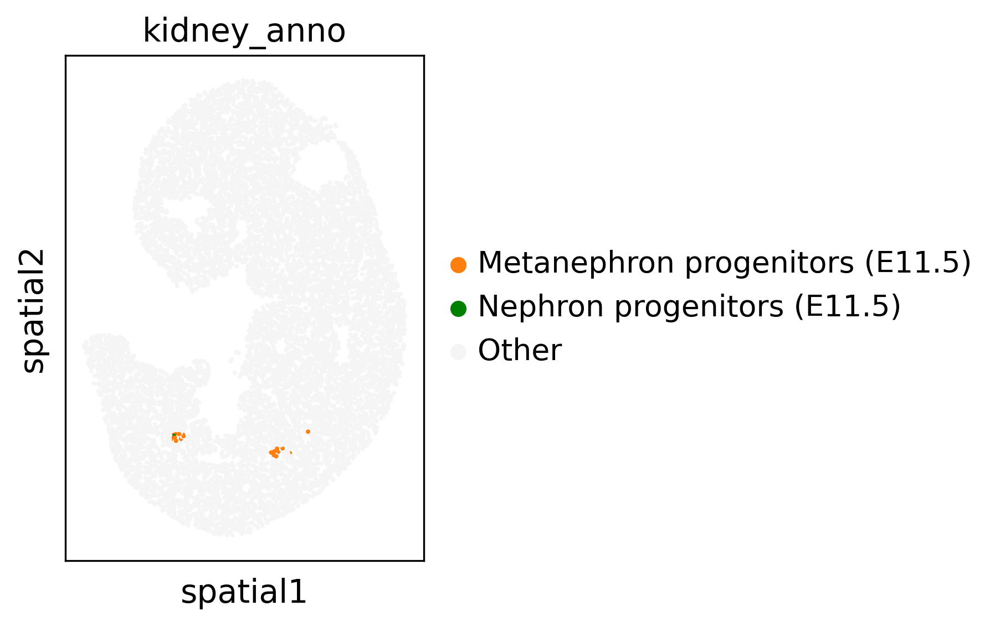

In [48]:
adata1.obs.kidney_anno = adata1.obs.kidney_anno.fillna('Other')
sc.pl.spatial(adata1, color=['kidney_anno'], spot_size=2.5, palette=['#ff7f0e', 'green','#F5F5F5'])

/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:242: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    Total :29 celltypes; Overlap: 11 cell types 
                    Not overlap :[['Sclerotome', 'Inner ear', 'Head mesenchyme', 'Branchial arch', 'Dermomyotome', 'Surface ectoderm', 'Spinal cord', 'Mesentery', 'Sympathetic nerve', 'Kidney', 'Epidermis', 'Pancreas', 'Choroid plexus', 'Ovary', 'Cartilage primordium', 'Mucosal epithelium', 'Muscle', 'Mesothelium']]
Subsample 10000 cell pairs from 10001


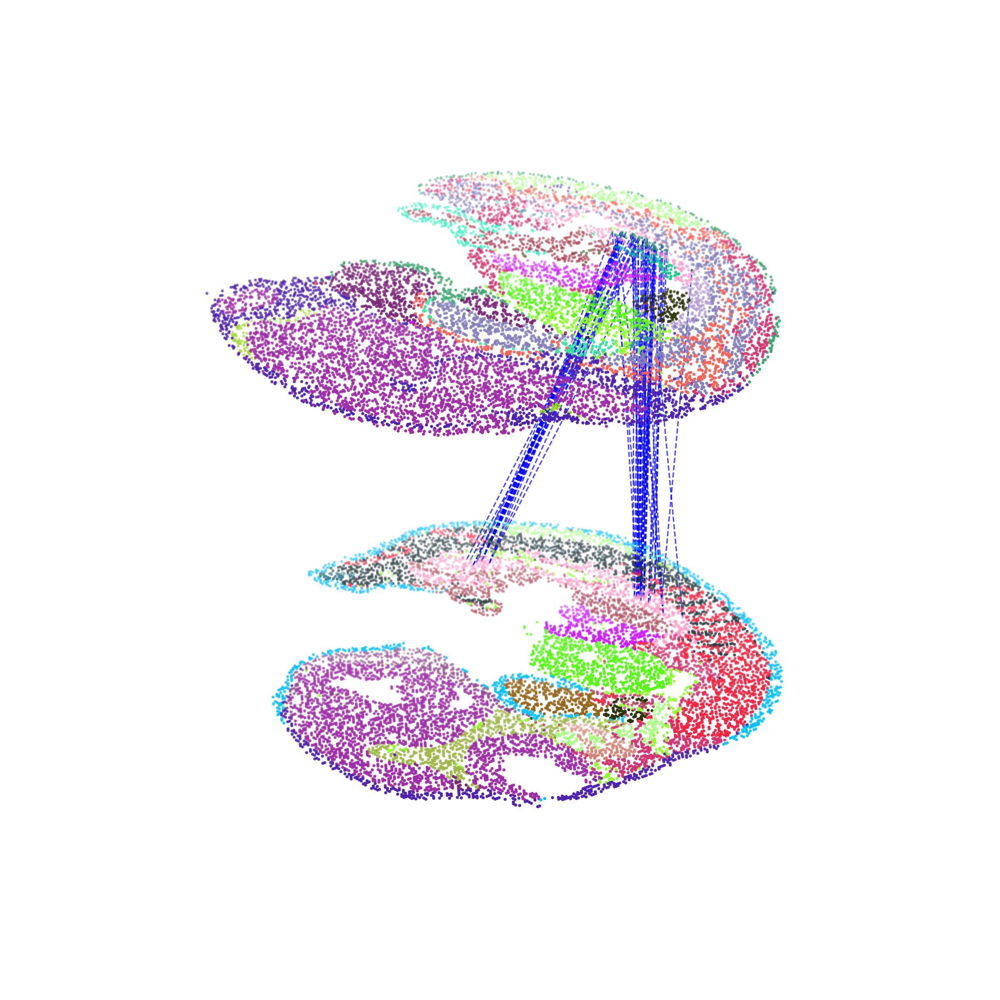

In [30]:
test = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['Urogenital ridge'],['Kidney']],subsample_size=10000, highlight_line = ['blue'],scale_coordinate = True )
test.draw_3D(size= [10, 12],line_width =0.8,point_size=[0.6,0.6], hide_axis=True)

# Ovary in development

/rd2/user/xiacr/SLAT/scSLAT/viz/multi_dataset.py:242: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    Total :29 celltypes; Overlap: 11 cell types 
                    Not overlap :[['Sclerotome', 'Inner ear', 'Head mesenchyme', 'Branchial arch', 'Dermomyotome', 'Surface ectoderm', 'Spinal cord', 'Mesentery', 'Sympathetic nerve', 'Kidney', 'Epidermis', 'Pancreas', 'Choroid plexus', 'Ovary', 'Cartilage primordium', 'Mucosal epithelium', 'Muscle', 'Mesothelium']]
Subsample 10000 cell pairs from 10001


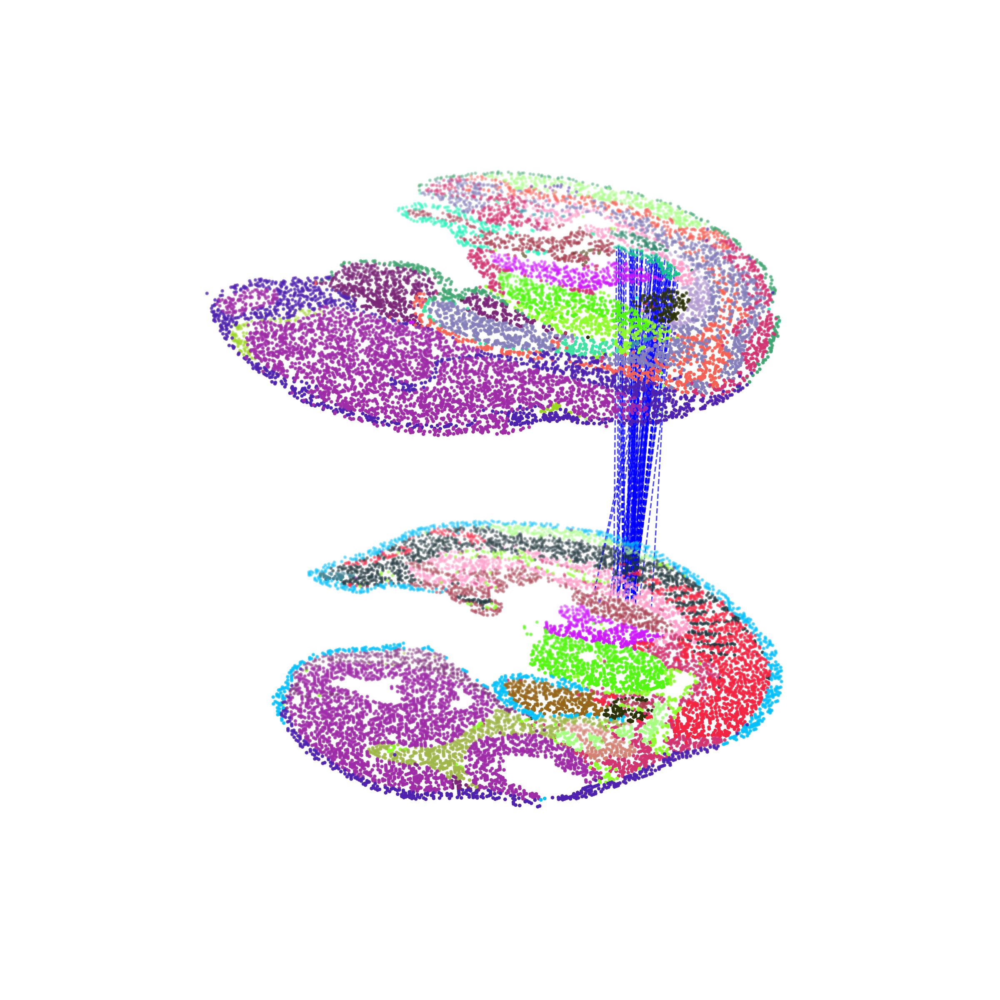

In [31]:
test = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['Urogenital ridge'],['Ovary']],subsample_size=10000, highlight_line = ['blue'],scale_coordinate = True)
test.draw_3D(size= [10, 12],line_width =0.8,point_size=[1.2,1.2], hide_axis=True)

# Highlight lung

In [32]:
adata1.obs['is_lung'] = 'Other'
adata2.obs['is_lung'] = 'Other'
adata1.obs.loc[adata1.obs.annotation=='Heart','is_lung'] = 'Heart'
adata2.obs.loc[adata2.obs.annotation=='Heart','is_lung'] = 'Heart'
adata1.obs.loc[adata1.obs.annotation=='Lung primordium','is_lung'] = 'Lung primordium'
adata2.obs.loc[adata2.obs.annotation=='Lung primordium','is_lung'] = 'Lung primordium'


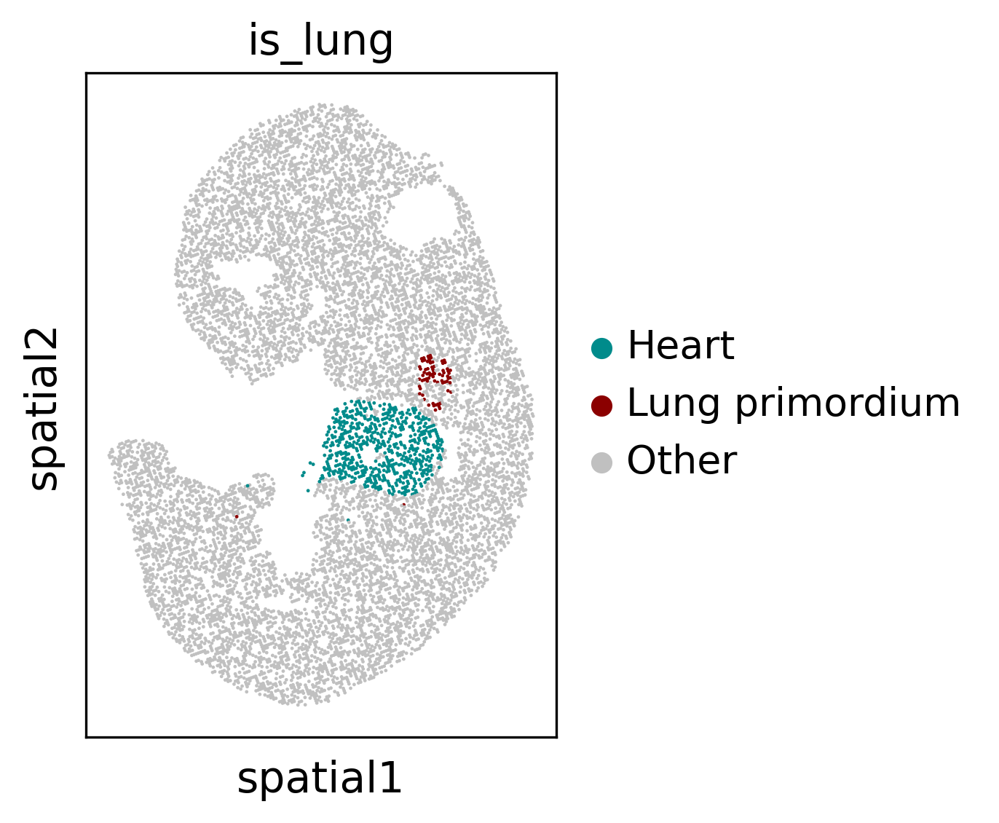

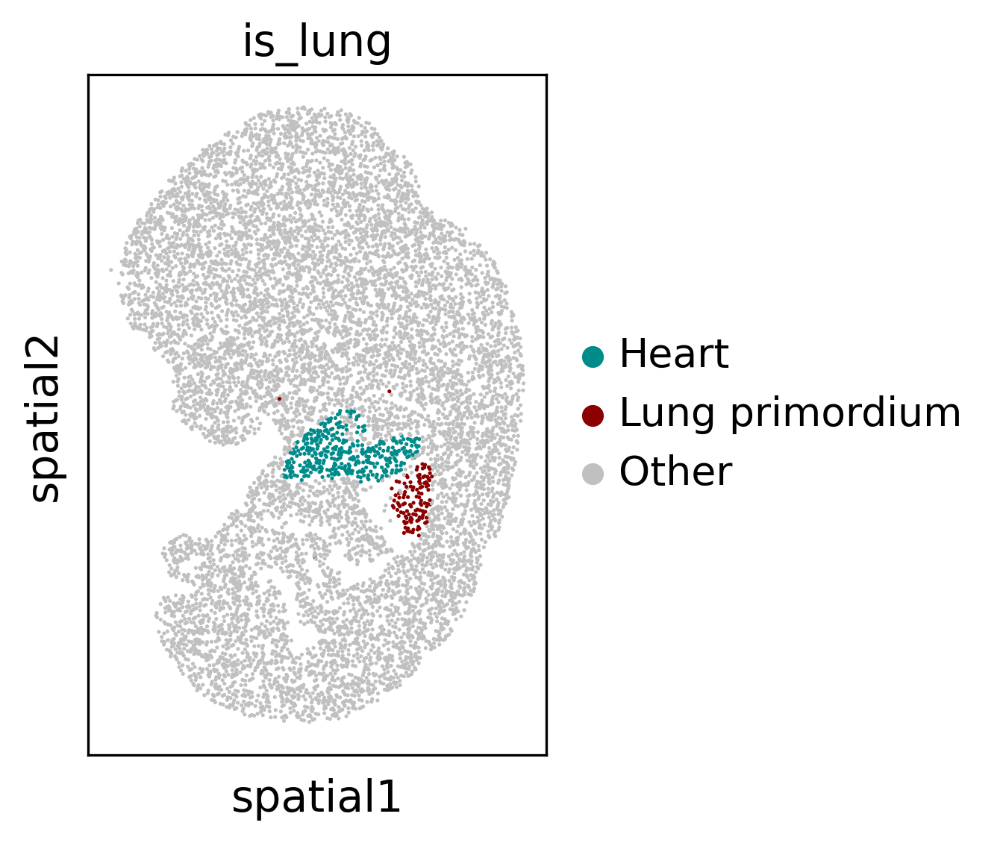

In [39]:
sc.pl.spatial(adata1, color=['is_lung'], spot_size=1.5, palette=['#008B8B','#8B0000','#C0C0C0'])
sc.pl.spatial(adata2, color=['is_lung'], spot_size=2, palette =['#008B8B','#8B0000','#C0C0C0'])

# Save data

In [ ]:
adata1.write_h5ad('./adata1_processed.h5ad')
adata2.write_h5ad('./adata2_processed.h5ad')